###**1. Author**


**Ritika Gupta**


Using the MLEnd dataset, I  built a model that predicts the song label of a short audio segment and used SVM model for getting accuracy.


### **2. Problem Formulation**

Below I have solved a machine learning problem that takes as an input a Potter or StarWars audio segments and predicts its song label (either Potter or StarWars)

The interesting  thing about it is the features extracted from the audio signals of Potter and StarWars audio signals and modelling the features through SVM classifier to predict the audio labels.(Potter or StarWars)

### **3. Machine Learning pipeline**


**Input :** 
For the input we have taken "Humming or Whistling" Starwars or Potter audio files.

**Output:** 
For the output we would be gettting "StarWars" or "Potter" song labels 

**Intermediate Stages:**

1. Environment Setup: Loading the required libraries and accessing to drive
2. Data Accessing from Drive
3. Exploratory Data Analysis

Finding the number of files in the google drive "Mini_Project" folder.

Displaying the various(5) audio files

Getting the name of the audio files
4. Extracted Features:

Power.

Pitch mean.

Pitch standard deviation.

Fraction of voiced region.
5. Building training and testing data
6. Modelling 
7. Finding Accuracy
8. Finding the best value of C and gamma value for SVC
9. Displaying the confusion matrix
10. Displaying the Classification Report
11. Plotting heatmap
12. Predict the value of the validation accuracy as a function of C


###**4. Transformation stage**
For each audio file we computed the respective 4 features.The four features we used are as follows
1.   Power.
2.   Pitch mean.
3.   Pitch standard deviation.
4.   Fraction of voiced region.

We got the corresponding y(song label) for each file .We prepared our training dataset with all features stored in X and all labels in y vector.




###**5. Modelling**

SVM classifier provided by scikit-learn is used .We have split the dataset defined by X_train,y_train and X_val,y_val  into a training set and a validation set.

###  **6. Methodology**
1. For training and validating the dataset I have split the dataset and modelled through SVM .
2. Computed accuracy of the SVM model
3. Found the best value of C and gamma value for SVC .
4. Displayed confusion matrix 
5. Displayed the Classification Report
6. Plotted heatmap
7. Predict the value of the validation accuracy as a function of C



### **7. Dataset**
Below I have used "Starwars" and  "Potter" audio files stored in the folder "Mini_Project" in Google drive

#####**Environment Setup:**



Loading the required libraries and accessing to drive


In [ ]:
from google.colab import drive
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os, sys, re, pickle, glob
import urllib.request
import IPython.display as ipd
from tqdm import tqdm
import librosa
drive.mount('/content/drive')

Mounted at /content/drive


#####**Data Accessing from Drive**

In this section we will access the data that we need to build our solution. Note that even though we call it "training" dataset you can do whatever you want with it, for instance validation tasks. Note that we keep a separate dataset for testing purposes, which we won't share with anyone.

We are accessing the dataset of (Potter and StarWars audio files) by giving a google drive path.

In [ ]:
path = '/content/drive/MyDrive/Mini_Project'
os.listdir(path)

['S100_hum_4_StarWars.wav',
 'S100_hum_3_StarWars.wav',
 'S196_hum_3_StarWars.wav',
 'S131_hum_2_StarWars.wav',
 'S131_whistle_2_StarWars.wav',
 'S84_hum_4_StarWars.wav',
 'S216_hum_4_StarWars.wav',
 'S176_whistle_2_StarWars.wav',
 'S84_hum_3_StarWars.wav',
 'S176_hum_2_StarWars.wav',
 'S21_hum_4_StarWars.wav',
 'S216_hum_3_StarWars.wav',
 'S21_hum_3_StarWars.wav',
 'S26_hum_4_StarWars.wav',
 'S26_hum_3_StarWars.wav',
 'S187_whistle_2_StarWars.wav',
 'S111_hum_3_StarWars.wav',
 'S187_hum_2_StarWars.wav',
 'S63_hum_3_StarWars.wav',
 'S70_hum_4_StarWars.wav',
 'S53_hum_3_StarWars.wav',
 'S177_hum_4_StarWars.wav',
 'S111_hum_4_StarWars.wav',
 'S53_hum_4_StarWars.wav',
 'S177_hum_3_StarWars.wav',
 'S19_hum_3_StarWars.wav',
 'S70_hum_3_StarWars.wav',
 'S19_hum_4_StarWars.wav',
 'S77_hum_2_StarWars.wav',
 'S108_hum_2_StarWars.wav',
 'S28_hum_3_StarWars.wav',
 'S108_whistle_2_StarWars.wav',
 'S28_hum_4_StarWars.wav',
 'S77_whistle_2_StarWars.wav',
 'S137_hum_3_StarWars.wav',
 'S137_hum_4_Star

**Exploratory Data Analysis**


Finding the number of files in the google drive "Mini_Project" folder.

In [ ]:
sample_path = '/content/drive/MyDrive/Mini_Project/*.wav'
files = glob.glob(sample_path)
len(files)

821

**Displaying the random(5) audio files**

In [ ]:
for _ in range(5):
  n = np.random.randint(821)
  display(ipd.Audio(files[n]))

##### **Getting the name of the audio files**

In [ ]:
for file in files:
  print(file.split('/')[-1])

S100_hum_4_StarWars.wav
S100_hum_3_StarWars.wav
S196_hum_3_StarWars.wav
S131_hum_2_StarWars.wav
S131_whistle_2_StarWars.wav
S84_hum_4_StarWars.wav
S216_hum_4_StarWars.wav
S176_whistle_2_StarWars.wav
S84_hum_3_StarWars.wav
S176_hum_2_StarWars.wav
S21_hum_4_StarWars.wav
S216_hum_3_StarWars.wav
S21_hum_3_StarWars.wav
S26_hum_4_StarWars.wav
S26_hum_3_StarWars.wav
S187_whistle_2_StarWars.wav
S111_hum_3_StarWars.wav
S187_hum_2_StarWars.wav
S63_hum_3_StarWars.wav
S70_hum_4_StarWars.wav
S53_hum_3_StarWars.wav
S177_hum_4_StarWars.wav
S111_hum_4_StarWars.wav
S53_hum_4_StarWars.wav
S177_hum_3_StarWars.wav
S19_hum_3_StarWars.wav
S70_hum_3_StarWars.wav
S19_hum_4_StarWars.wav
S77_hum_2_StarWars.wav
S108_hum_2_StarWars.wav
S28_hum_3_StarWars.wav
S108_whistle_2_StarWars.wav
S28_hum_4_StarWars.wav
S77_whistle_2_StarWars.wav
S137_hum_3_StarWars.wav
S137_hum_4_StarWars.wav
S214_hum_2_StarWars.wav
S101_hum_3_StarWars.wav
S214_whistle_2_StarWars.wav
S121_hum_3_StarWars.wav
S99_hum_2_StarWars.wav
S121_hum_4

##### **Getting full path and other details of a audio file at index n=0**

In [ ]:
print('The full path to the first audio file is: ', files[0])
print('\n')
print('The name of the first audio file is: ', files[0].split('/')[-1])
print('    The participand ID is: ', files[0].split('/')[-1].split('_')[0])
print('    The type of interpretation is: ', files[0].split('/')[-1].split('_')[1])
print('    The interpretation number is: ', files[0].split('/')[-1].split('_')[2])
print('    The song is: ', files[0].split('/')[-1].split('_')[3])

The full path to the first audio file is:  /content/drive/MyDrive/Mini_Project/S100_hum_4_StarWars.wav


The name of the first audio file is:  S100_hum_4_StarWars.wav
    The participand ID is:  S100
    The type of interpretation is:  hum
    The interpretation number is:  4
    The song is:  StarWars.wav


##### **Creating a table "MLENDHW" for displaying all the files with their name ,participant ID,interpretation_type,interpretation_number and song.**

In [ ]:
MLENDHW_table = [] 

for file in files:
  file_name = file.split('/')[-1]
  participant_ID = file.split('/')[-1].split('_')[0]
  interpretation_type = file.split('/')[-1].split('_')[1]
  interpretation_number = file.split('/')[-1].split('_')[2]
  song = file.split('/')[-1].split('_')[3].split('.')[0]
  MLENDHW_table.append([file_name,participant_ID,interpretation_type,interpretation_number, song])

MLENDHW_table

[['S100_hum_4_StarWars.wav', 'S100', 'hum', '4', 'StarWars'],
 ['S100_hum_3_StarWars.wav', 'S100', 'hum', '3', 'StarWars'],
 ['S196_hum_3_StarWars.wav', 'S196', 'hum', '3', 'StarWars'],
 ['S131_hum_2_StarWars.wav', 'S131', 'hum', '2', 'StarWars'],
 ['S131_whistle_2_StarWars.wav', 'S131', 'whistle', '2', 'StarWars'],
 ['S84_hum_4_StarWars.wav', 'S84', 'hum', '4', 'StarWars'],
 ['S216_hum_4_StarWars.wav', 'S216', 'hum', '4', 'StarWars'],
 ['S176_whistle_2_StarWars.wav', 'S176', 'whistle', '2', 'StarWars'],
 ['S84_hum_3_StarWars.wav', 'S84', 'hum', '3', 'StarWars'],
 ['S176_hum_2_StarWars.wav', 'S176', 'hum', '2', 'StarWars'],
 ['S21_hum_4_StarWars.wav', 'S21', 'hum', '4', 'StarWars'],
 ['S216_hum_3_StarWars.wav', 'S216', 'hum', '3', 'StarWars'],
 ['S21_hum_3_StarWars.wav', 'S21', 'hum', '3', 'StarWars'],
 ['S26_hum_4_StarWars.wav', 'S26', 'hum', '4', 'StarWars'],
 ['S26_hum_3_StarWars.wav', 'S26', 'hum', '3', 'StarWars'],
 ['S187_whistle_2_StarWars.wav', 'S187', 'whistle', '2', 'StarWars

##### **Building a dataframe from the "MLENDHW_table" above**

In [ ]:
MLENDHW_df = pd.DataFrame(MLENDHW_table,columns=['file_id','participant','interpretation','number','song']).set_index('file_id') 
MLENDHW_df

,participant,interpretation,number,song
file_id,,,,
S100_hum_4_StarWars.wav,S100,hum,4,StarWars
S100_hum_3_StarWars.wav,S100,hum,3,StarWars
S196_hum_3_StarWars.wav,S196,hum,3,StarWars
S131_hum_2_StarWars.wav,S131,hum,2,StarWars
S131_whistle_2_StarWars.wav,S131,whistle,2,StarWars
...,...,...,...,...
S91_whistle_2_StarWars.wav,S91,whistle,2,StarWars
S91_hum_2_StarWars.wav,S91,hum,2,StarWars
S24_whistle_2_StarWars.wav,S24,whistle,2,StarWars


##### **Finding out the number of "Potter" or "StarWars" audio files in the dataframe(MLENDHW_df).**

In [ ]:
### Check whether the dataset is imbalanced
MLENDHW_df['song'].value_counts()

Potter      415
StarWars    406
Name: song, dtype: int64

##### **Displaying the audio signal**

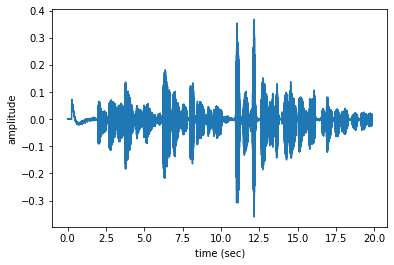

In [ ]:
n=0
fs = None # Sampling frequency. If None, fs would be 22050
x, fs = librosa.load(files[n],sr=fs)
t = np.arange(len(x))/fs
plt.plot(t,x)
plt.xlabel('time (sec)')
plt.ylabel('amplitude')
plt.show()
display(ipd.Audio(files[n]))

In [ ]:
MLENDHW_df.loc[files[n].split('/')[-1]]

participant           S100
interpretation         hum
number                   4
song              StarWars
Name: S100_hum_4_StarWars.wav, dtype: object

##### **Displaying the number of samples in a audio file**

In [ ]:
n=0
x, fs = librosa.load(files[n],sr=fs)
print('This audio signal has', len(x), 'samples')

This audio signal has 875547 samples



One approach is to extract a few features from our signals and use these features instead as predictors. In the following cell, we define a function that extracts four features from an audio signal, namely:


1.   Power.
2.   Pitch mean.
3.   Pitch standard deviation.
4.   Fraction of voiced region.

In the next cell, we define a new function that gets the pitch of an audio signal.

In [ ]:
def getPitch(x,fs,winLen=0.02):
  #winLen = 0.02 
  p = winLen*fs
  frame_length = int(2**int(p-1).bit_length())
  hop_length = frame_length//2
  f0, voiced_flag, voiced_probs = librosa.pyin(y=x, fmin=80, fmax=450, sr=fs,
                                                 frame_length=frame_length,hop_length=hop_length)
  return f0,voiced_flag

In [ ]:
def getXy(files,labels_file, scale_audio=False, onlySingleDigit=False):
  X,y =[],[]
  for file in tqdm(files):
    fileID = file.split('/')[-1]
    file_name = file.split('/')[-1]
    #print(file_name)
    #print(labels_file.loc[fileID]['interpretation'])
    #print(labels_file.loc[fileID]['interpretation']=='hum')
    #yi = list(labels_file.loc[fileID]['interpretation'])[0]=='hum'
    yi = labels_file.loc[fileID]['song']=='StarWars'

    fs = None # if None, fs would be 22050
    x, fs = librosa.load(file,sr=fs)
    if scale_audio: x = x/np.max(np.abs(x))
    f0, voiced_flag = getPitch(x,fs,winLen=0.02)
      
    power = np.sum(x**2)/len(x)
    pitch_mean = np.nanmean(f0) if np.mean(np.isnan(f0))<1 else 0
    pitch_std  = np.nanstd(f0) if np.mean(np.isnan(f0))<1 else 0
    voiced_fr = np.mean(voiced_flag)

    xi = [power,pitch_mean,pitch_std,voiced_fr]
    X.append(xi)
    y.append(yi)

  return np.array(X),np.array(y)

##### **Data PreProcessing**

Apply `getXy` to the files to get the 4 features  in "X" and corresponding song labels in "y"

In [ ]:
X,y = getXy(files, labels_file=MLENDHW_df, scale_audio=True, onlySingleDigit=True)

100%|██████████| 821/821 [44:20<00:00,  3.24s/it]




Finding out the shapes of "X" and the song label values as "True" or "False" in vector "y"

In [ ]:
print('The shape of X is', X.shape) 
print('The shape of y is', y.shape)
print('The labels vector is', y)


The shape of X is (821, 4)
The shape of y is (821,)
The labels vector is [ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  T

##### **Displaying the number of "StarWars" and "Potter" song labels**

In [ ]:
print(' The number of StarWars song label recordings is ', np.count_nonzero(y))
print(' The number of Potter song label recordings is ', y.size - np.count_nonzero(y))

 The number of StarWars song label recordings is  406
 The number of Potter song label recordings is  415


##### **Modeling: Support Vector Machines**
Splitting the dataset into X and y training and validation set in which X_train will have the training features and y_train will have corresponding song labels.Similarly X_val wil have validation features and y_val will have correspong song labels.

In [ ]:
from sklearn import svm
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X,y,test_size=0.3)
X_train.shape, X_val.shape, y_train.shape, y_val.shape

((574, 4), (247, 4), (574,), (247,))


### **8. Results**
Using SVM classifier,finding training and validating Accuracy


In [ ]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
model=make_pipeline(StandardScaler(),SVC(C=2))
model.fit(X_train,y_train)

yt_p = model.predict(X_train)
yv_p = model.predict(X_val)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))


Training Accuracy 0.681184668989547
Validation  Accuracy 0.6437246963562753


In [ ]:
mean = X_train.mean(0)
sd =  X_train.std(0)

X_train = (X_train-mean)/sd
X_val  = (X_val-mean)/sd

model=make_pipeline(StandardScaler(), SVC(gamma=0.1,C=4))
model.fit(X_train,y_train)

yt_p = model.predict(X_train)
yv_p = model.predict(X_val)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))
#print('The support vectors are', model.support_vectors_.shape)

Training Accuracy 0.6567944250871081
Validation  Accuracy 0.6558704453441295


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
from sklearn import metrics
from sklearn.model_selection import GridSearchCV
import seaborn as sn
# Defining the C value, Gamma and kernel
param_grid = { 'C':[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1,2,3,4,5,6,7,8,9,10,11],'kernel': ['rbf'],'gamma':[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1,2,3,4,5,6,7]}
grid = GridSearchCV(SVC(),param_grid,refit=True,verbose=2)
grid.fit(X_train,y_train)

# Printing the best parameter value
print("Best Parameter Value: \n\n", grid.best_params_)
grid_predictions=grid.predict(X_val)



Fitting 5 folds for each of 320 candidates, totalling 1600 fits
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.2, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.2, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.2, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.2, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.2, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.3, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=

**Observations:** Having C = 0.7 & Gamma =6 gives the best value


*   Creating a Confusion Matrix
*   Classification Report
*   Heatmap

In [ ]:
# Printing the confusion matrix
con_mat = confusion_matrix(y_val,grid_predictions)
print(con_mat)
# Printing the Classification Report
print(classification_report(y_val,grid_predictions))


[[84 37]
 [52 74]]
              precision    recall  f1-score   support

       False       0.62      0.69      0.65       121
        True       0.67      0.59      0.62       126

    accuracy                           0.64       247
   macro avg       0.64      0.64      0.64       247
weighted avg       0.64      0.64      0.64       247



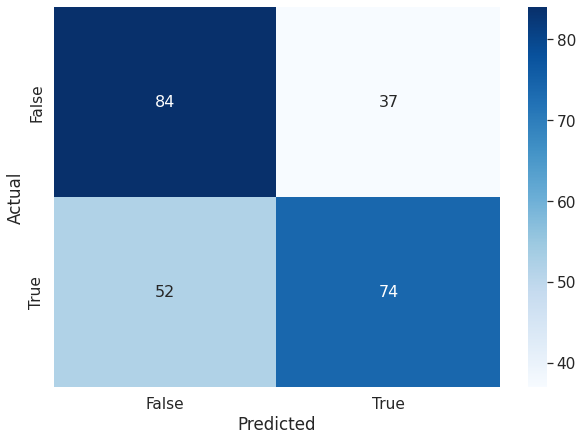

In [ ]:
#Plotting heatmap
df_cm = pd.DataFrame(con_mat, columns=np.unique(y_val), index = np.unique(y_val))
df_cm.index.name = 'Actual'
df_cm.columns.name = 'Predicted'
plt.figure(figsize = (10,7))
sn.set(font_scale=1.4)#for label size
sn.heatmap(df_cm, cmap="Blues", annot=True,annot_kws={"size": 16})# font size

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Training Accuracy 0.6167247386759582
Validation  Accuracy 0.5789473684210527
Confusion matrix for Training:
 [[277  17]
 [203  77]]

Confusion matrix for Validation:
 [[114   7]
 [ 97  29]]

Normalised confusion matrix for Training:
 [[0.94217687 0.05782313]
 [0.725      0.275     ]]

Normalised confusion matrix for Validation :
 [[0.94214876 0.05785124]
 [0.76984127 0.23015873]]



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Training Accuracy 0.7195121951219512
Validation  Accuracy 0.6518218623481782
Confusion matrix for Training:
 [[254  40]
 [121 159]]

Confusion matrix for Validation:
 [[104  17]
 [ 69  57]]

Normalised confusion matrix for Training:
 [[0.86394558 0.13605442]
 [0.43214286 0.56785714]]

Normalised confusion matrix for Validation :
 [[0.85950413 0.14049587]
 [0.54761905 0.45238095]]



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Training Accuracy 0.7526132404181185
Validation  Accuracy 0.6477732793522267
Confusion matrix for Training:
 [[237  57]
 [ 85 195]]

Confusion matrix for Validation:
 [[97 24]
 [63 63]]

Normalised confusion matrix for Training:
 [[0.80612245 0.19387755]
 [0.30357143 0.69642857]]

Normalised confusion matrix for Validation :
 [[0.80165289 0.19834711]
 [0.5        0.5       ]]



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Training Accuracy 0.7717770034843205
Validation  Accuracy 0.6437246963562753
Confusion matrix for Training:
 [[232  62]
 [ 69 211]]

Confusion matrix for Validation:
 [[88 33]
 [55 71]]

Normalised confusion matrix for Training:
 [[0.78911565 0.21088435]
 [0.24642857 0.75357143]]

Normalised confusion matrix for Validation :
 [[0.72727273 0.27272727]
 [0.43650794 0.56349206]]



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Training Accuracy 0.7839721254355401
Validation  Accuracy 0.6356275303643725
Confusion matrix for Training:
 [[231  63]
 [ 61 219]]

Confusion matrix for Validation:
 [[82 39]
 [51 75]]

Normalised confusion matrix for Training:
 [[0.78571429 0.21428571]
 [0.21785714 0.78214286]]

Normalised confusion matrix for Validation :
 [[0.67768595 0.32231405]
 [0.4047619  0.5952381 ]]



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Training Accuracy 0.789198606271777
Validation  Accuracy 0.6275303643724697
Confusion matrix for Training:
 [[232  62]
 [ 59 221]]

Confusion matrix for Validation:
 [[82 39]
 [53 73]]

Normalised confusion matrix for Training:
 [[0.78911565 0.21088435]
 [0.21071429 0.78928571]]

Normalised confusion matrix for Validation :
 [[0.67768595 0.32231405]
 [0.42063492 0.57936508]]



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Training Accuracy 0.7926829268292683
Validation  Accuracy 0.6437246963562753
Confusion matrix for Training:
 [[232  62]
 [ 57 223]]

Confusion matrix for Validation:
 [[84 37]
 [51 75]]

Normalised confusion matrix for Training:
 [[0.78911565 0.21088435]
 [0.20357143 0.79642857]]

Normalised confusion matrix for Validation :
 [[0.69421488 0.30578512]
 [0.4047619  0.5952381 ]]



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Training Accuracy 0.7909407665505227
Validation  Accuracy 0.6396761133603239
Confusion matrix for Training:
 [[232  62]
 [ 58 222]]

Confusion matrix for Validation:
 [[85 36]
 [53 73]]

Normalised confusion matrix for Training:
 [[0.78911565 0.21088435]
 [0.20714286 0.79285714]]

Normalised confusion matrix for Validation :
 [[0.70247934 0.29752066]
 [0.42063492 0.57936508]]



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Training Accuracy 0.794425087108014
Validation  Accuracy 0.6437246963562753
Confusion matrix for Training:
 [[234  60]
 [ 58 222]]

Confusion matrix for Validation:
 [[87 34]
 [54 72]]

Normalised confusion matrix for Training:
 [[0.79591837 0.20408163]
 [0.20714286 0.79285714]]

Normalised confusion matrix for Validation :
 [[0.71900826 0.28099174]
 [0.42857143 0.57142857]]



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Training Accuracy 0.7961672473867596
Validation  Accuracy 0.6396761133603239
Confusion matrix for Training:
 [[235  59]
 [ 58 222]]

Confusion matrix for Validation:
 [[87 34]
 [55 71]]

Normalised confusion matrix for Training:
 [[0.79931973 0.20068027]
 [0.20714286 0.79285714]]

Normalised confusion matrix for Validation :
 [[0.71900826 0.28099174]
 [0.43650794 0.56349206]]



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Training Accuracy 0.8153310104529616
Validation  Accuracy 0.6275303643724697
Confusion matrix for Training:
 [[240  54]
 [ 52 228]]

Confusion matrix for Validation:
 [[87 34]
 [58 68]]

Normalised confusion matrix for Training:
 [[0.81632653 0.18367347]
 [0.18571429 0.81428571]]

Normalised confusion matrix for Validation :
 [[0.71900826 0.28099174]
 [0.46031746 0.53968254]]



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Training Accuracy 0.837979094076655
Validation  Accuracy 0.6477732793522267
Confusion matrix for Training:
 [[246  48]
 [ 45 235]]

Confusion matrix for Validation:
 [[87 34]
 [53 73]]

Normalised confusion matrix for Training:
 [[0.83673469 0.16326531]
 [0.16071429 0.83928571]]

Normalised confusion matrix for Validation :
 [[0.71900826 0.28099174]
 [0.42063492 0.57936508]]



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Training Accuracy 0.8466898954703833
Validation  Accuracy 0.6558704453441295
Confusion matrix for Training:
 [[249  45]
 [ 43 237]]

Confusion matrix for Validation:
 [[90 31]
 [54 72]]

Normalised confusion matrix for Training:
 [[0.84693878 0.15306122]
 [0.15357143 0.84642857]]

Normalised confusion matrix for Validation :
 [[0.74380165 0.25619835]
 [0.42857143 0.57142857]]



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Training Accuracy 0.8815331010452961
Validation  Accuracy 0.6437246963562753
Confusion matrix for Training:
 [[258  36]
 [ 32 248]]

Confusion matrix for Validation:
 [[89 32]
 [56 70]]

Normalised confusion matrix for Training:
 [[0.87755102 0.12244898]
 [0.11428571 0.88571429]]

Normalised confusion matrix for Validation :
 [[0.73553719 0.26446281]
 [0.44444444 0.55555556]]



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Training Accuracy 0.9233449477351916
Validation  Accuracy 0.6275303643724697
Confusion matrix for Training:
 [[271  23]
 [ 21 259]]

Confusion matrix for Validation:
 [[83 38]
 [54 72]]

Normalised confusion matrix for Training:
 [[0.92176871 0.07823129]
 [0.075      0.925     ]]

Normalised confusion matrix for Validation :
 [[0.68595041 0.31404959]
 [0.42857143 0.57142857]]



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Training Accuracy 0.9512195121951219
Validation  Accuracy 0.5951417004048583
Confusion matrix for Training:
 [[280  14]
 [ 14 266]]

Confusion matrix for Validation:
 [[74 47]
 [53 73]]

Normalised confusion matrix for Training:
 [[0.95238095 0.04761905]
 [0.05       0.95      ]]

Normalised confusion matrix for Validation :
 [[0.61157025 0.38842975]
 [0.42063492 0.57936508]]



<IPython.core.display.Javascript object>

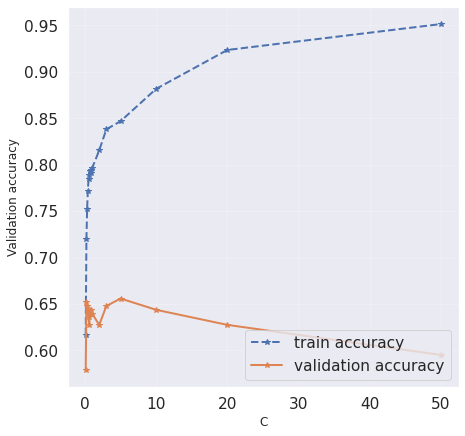

In [ ]:
from google.colab import widgets
from sklearn.metrics import confusion_matrix

# Standardization
mean = X_train.mean(0)
sd =  X_train.std(0)
X_train = (X_train-mean)/sd
X_val  = (X_val-mean)/sd
C_values =[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1,2,3,5,10,20,50]

# Initialize tabs
tb = widgets.TabBar([str(C) for C in C_values])

accuracy = dict.fromkeys(C_values)
train_accuracy = dict.fromkeys(C_values)
for C in C_values:
  with tb.output_to(str(C), select= (C < 1)):

    # Model Training
    model  = svm.SVC(kernel='rbf',C=float(C),gamma=2)
    model.fit(X_train,y_train)
    
    # Predict using the model for both training and validation data
    yt_p = model.predict(X_train)
    yv_p = model.predict(X_val)
    print('Training Accuracy', np.mean(yt_p==y_train))
    print('Validation  Accuracy', np.mean(yv_p==y_val))
    accuracy[C] = np.mean(yv_p==y_val)
    train_accuracy[C] = np.mean(yt_p==y_train)
    
    # Generating the confusion matrix    
    trainMatrix = confusion_matrix(y_true=y_train, y_pred=yt_p)
    trainMatrix_nor = trainMatrix.astype('float') / trainMatrix.sum(axis=1)[:, np.newaxis]
    valMatrix = confusion_matrix(y_true=y_val, y_pred=yv_p)
    valMatrix_nor = valMatrix.astype('float') / valMatrix.sum(axis=1)[:, np.newaxis]

    print('Confusion matrix for Training:\n {}\n'.format(trainMatrix))
    print('Confusion matrix for Validation:\n {}\n'.format(valMatrix))

    print('Normalised confusion matrix for Training:\n {}\n'.format(trainMatrix_nor))
    print('Normalised confusion matrix for Validation :\n {}\n'.format(valMatrix_nor))

# Here we predict the value of the validation accuracy as a function of C
plt.figure(figsize=(7, 7))
plt.plot(C_values , list(train_accuracy.values()),'--*',label = 'train accuracy', linewidth=2)
plt.plot(C_values, list(accuracy.values()),'-*',label = 'validation accuracy', linewidth=2)
plt.xlabel("C", fontsize=12)
plt.ylabel("Validation accuracy", fontsize=12)
plt.grid(alpha=0.2)
plt.legend(loc="lower right")
plt.show()

### **9 Conclusions**


Parameter values with C=0.1 and gamma=2 giving the best result

**Confusion Matrix:** 
SVM gave us the best model with gamma = 2 and C = 0.1 giving the best accuracy. 